### Plotting

In [2]:
# Import key librares and modules 
import pandas as pd
import numpy as np
import datetime as dt
import yfinance as yf
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import cufflinks as cf
cf.go_offline()
amzn_df = yf.download('AMZN', start='2020-01-01', end='2023-12-31')
amzn_df.head(4)

[*********************100%***********************]  1 of 1 completed


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2020-01-02,93.750000,94.900497,93.207497,94.900497,94.900497,80580000
2020-01-03,93.224998,94.309998,93.224998,93.748497,93.748497,75288000
2020-01-06,93.000000,95.184502,93.000000,95.143997,95.143997,81236000
2020-01-07,95.224998,95.694504,94.601997,95.343002,95.343002,80898000


$$
r_t = \frac{P_t - P_{t-1}}{P_{t-1}} *100
$$



In [3]:
# Calculate the percentage daily return
amzn_df['Daily Return'] = amzn_df['Adj Close'].pct_change(1) * 100
# Let's drop the NaN values (first row)
amzn_df['Daily Return'].dropna(inplace=True)
amzn_df.describe().round()

,Open,High,Low,Close,Adj Close,Volume,Daily Return
count,1006.0,1006.0,1006.0,1006.0,1006.0,1006.0,1005.0
mean,137.0,139.0,135.0,137.0,137.0,75379056.0,0.0
std,28.0,28.0,27.0,27.0,27.0,33827668.0,2.0
min,82.0,83.0,81.0,82.0,82.0,22378400.0,-14.0
25%,114.0,116.0,112.0,114.0,114.0,52785025.0,-1.0
50%,141.0,143.0,139.0,141.0,141.0,65770000.0,0.0
75%,161.0,163.0,159.0,161.0,161.0,87291650.0,1.0
max,187.0,189.0,185.0,187.0,187.0,311346000.0,14.0


In [4]:
# Plot a Line Plot Using Plotly Express
fig = px.line(title='Amazon.com, Inc. (AMZN) Adjusted Closing Price [$]')
fig.add_scatter(x=amzn_df.index, y=amzn_df['Adj Close'], name='Adj Close')
fig.show()

In [5]:
# Define a function that performs interactive data visualization using Plotly Express
def plot_financial_data(df, title):

    fig = px.line(title = title)
    # For loop that plots all stock prices in the pandas dataframe df
    for i in df.columns[0:]:
        fig.add_scatter(x = df.index, y = df[i], name = i)
        fig.update_traces(line_width = 3)
        fig.update_layout({'plot_bgcolor': "white"})
    fig.show()

# Plot High, Low, Open, Close and Adj Close (drop Volume and Daily Return columns)
plot_financial_data(amzn_df.drop(['Volume', 'Daily Return'], axis = 1), 'Amazon.com, Inc. (AMZN) Stock Price [$]')

In [6]:
# Plot trading volume
plot_financial_data(amzn_df['Volume'].to_frame(), 'Amazon.com, Inc. (AMZN) Trading Volume')

In [7]:
# Plot % Daily Returns
plot_financial_data(amzn_df['Daily Return'].to_frame(), 'Amazon.com, Inc. (AMZN) % Daily Returns')

In [8]:
# Define a function that classifies the returns based on the magnitude
# Feel free to change these numbers
def percentage_return_classifier(percentage_return):
    if percentage_return > -0.3 and percentage_return <= 0.3:
        return 'Insignificant Change'
    elif percentage_return > 0.3 and percentage_return <= 3:
        return 'Positive Change'
    elif percentage_return > -3 and percentage_return <= -0.3:
        return 'Negative Change'
    elif percentage_return > 3 and percentage_return <= 7:
        return 'Large Positive Change'
    elif percentage_return > -7 and percentage_return <= -3:
        return 'Large Negative Change'
    elif percentage_return > 7:
        return 'Bull Run'
    elif percentage_return <= -7:
        return 'Bear Sell Off'
    
amzn_df['Trend'] = amzn_df['Daily Return'].apply(percentage_return_classifier)
amzn_df.head(4)

,Open,High,Low,Close,Adj Close,Volume,Daily Return,Trend
Date,,,,,,,,
2020-01-02,93.750000,94.900497,93.207497,94.900497,94.900497,80580000,NaN,None
2020-01-03,93.224998,94.309998,93.224998,93.748497,93.748497,75288000,-1.213903,Negative Change
2020-01-06,93.000000,95.184502,93.000000,95.143997,95.143997,81236000,1.488557,Positive Change
2020-01-07,95.224998,95.694504,94.601997,95.343002,95.343002,80898000,0.209162,Insignificant Change


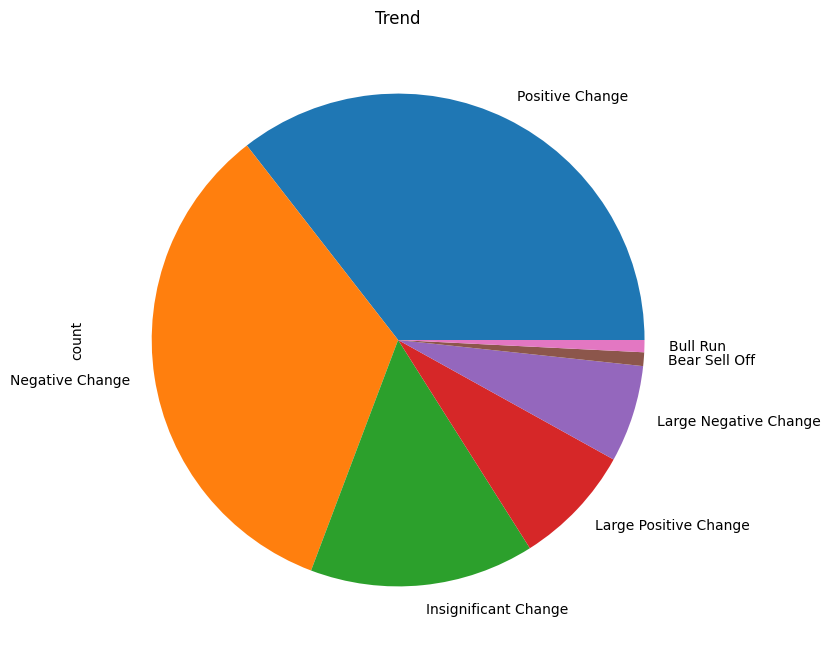

In [9]:
# Count distinct values in the Trend column
trend_summary = amzn_df['Trend'].value_counts()
# Plot a pie chart using Matplotlib Library
plt.figure(figsize = (9, 8))
trend_summary.plot(kind='pie', title='Trend');

In [10]:
figure = cf.QuantFig(amzn_df, title='Amazon.com, Inc. (AMZN) Stock Analysis')
figure.add_sma(periods=[14, 50], column='Adj Close', color=['blue', 'magenta'], width=2)
figure.iplot(theme='white', up_color='green', down_color='red')

c:\Users\Evan\AppData\Local\Programs\Python\Python310\lib\site-packages\cufflinks\plotlytools.py:117: FutureWarning:

DatetimeIndex.format is deprecated and will be removed in a future version. Convert using index.astype(str) or index.map(formatter) instead.

c:\Users\Evan\AppData\Local\Programs\Python\Python310\lib\site-packages\cufflinks\plotlytools.py:117: FutureWarning:

DatetimeIndex.format is deprecated and will be removed in a future version. Convert using index.astype(str) or index.map(formatter) instead.



#### Multiple Stocks

In [11]:
# Define the list of stock tickers
tickers = ['AMZN', 'JPM', 'META', 'PG', 'GOOG', 'CAT', 'PFE', 'EXC', 'DE', 'JNJ']

# Download historical data for these stocks
data = yf.download(tickers, start='2014-01-01', end='2023-01-01')

# Extract the 'Close' prices and create a DataFrame indexed by date
close_price_df = data['Close']

# Calculate daily returns
daily_returns_df = close_price_df.pct_change().dropna() * 100

# Display the first few rows of the DataFrame
close_price_df.head(4)

[*********************100%***********************]  10 of 10 completed


Ticker,AMZN,CAT,DE,EXC,GOOG,JNJ,JPM,META,PFE,PG
Date,,,,,,,,,,
2014-01-02 00:00:00+00:00,19.898500,89.870003,90.260002,19.379457,27.724083,91.029999,58.209999,54.709999,28.899431,80.540001
2014-01-03 00:00:00+00:00,19.822001,89.820000,90.660004,18.987162,27.521841,91.849998,58.660000,54.560001,28.956356,80.449997
2014-01-06 00:00:00+00:00,19.681499,88.639999,89.910004,19.108418,27.828691,92.330002,59.000000,57.200001,28.984819,80.639999
2014-01-07 00:00:00+00:00,19.901501,88.930000,90.309998,19.208275,28.365179,94.290001,58.320000,57.919998,29.165085,81.419998


In [12]:
plot_financial_data(close_price_df, 'Stock Prices [$]')

In [13]:
# Plot daily returns using plotly Express
plot_financial_data(daily_returns_df, 'Percentage Daily Returns [%]')

In [14]:
fig = px.histogram(daily_returns_df)
fig.update_layout({'plot_bgcolor': "white"})

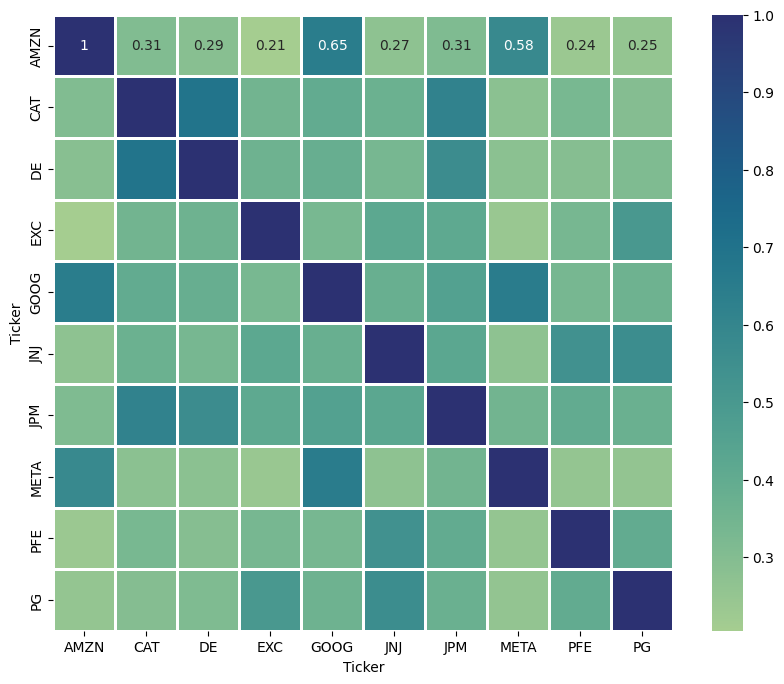

In [15]:
plt.figure(figsize = (10, 8))
sns.heatmap(daily_returns_df.corr(), annot = True, linewidths = 1, cmap='crest');

In [16]:
# Function to scale stock prices based on their initial starting price
# The objective of this function is to set all prices to start at a value of 1 
def price_scaling(raw_prices_df):
    scaled_prices_df = raw_prices_df.copy()
    for i in raw_prices_df.columns[0:]:
          scaled_prices_df[i] = raw_prices_df[i]/raw_prices_df[i][0]
    return scaled_prices_df

plot_financial_data(price_scaling(close_price_df), 'Scaled Stock Prices')

C:\Users\Evan\AppData\Local\Temp\ipykernel_18428\1972630185.py:6: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

